# 🧠 Brain Topographic Maps — ZuCo EEG Dataset

Visualises EEG activity **on the scalp** for:
- **Frequency bands**: Delta (δ), Theta (θ), Alpha (α), Beta (β), Gamma (γ)
- **Reading tasks**: Sentiment Reading (task1), Normal Reading (task2), Relation Reading (task3)
- **Sentiment & Relation conditions**

Uses MNE-Python's topographic mapping with the **EGI GSN-HydroCel 128** montage (same system used in ZuCo).

In [1]:
# Install mne if needed
try:
    import mne
except ImportError:
    !pip install mne
    import mne

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.signal import welch
import warnings
warnings.filterwarnings('ignore')
mne.set_log_level('ERROR')

print(f'MNE version: {mne.__version__} ✅')

Defaulting to user installation because normal site-packages is not writeable
  Using cached mne-1.11.0-py3-none-any.whl.metadata (15 kB)
Using cached mne-1.11.0-py3-none-any.whl (7.5 MB)
MNE version: 1.11.0 ✅


In [2]:
# Load the preprocessed dataset
df = pd.read_pickle('./data/tmp/zuco_eeg_label_8variants.df')
print(f'Loaded {len(df):,} samples')
print(f'EEG shape: {df.iloc[0]["eeg"].shape}  (time_points × channels)')

Loaded 22,335 samples
EEG shape: (1280, 128)  (time_points × channels)


---
## Setup: EGI Channel Montage

ZuCo uses a **128-channel EGI HydroCel Geodesic Sensor Net**. The raw data has **104 active channels** (105 minus 1 empty). We map these to the standard GSN-HydroCel-129 montage.

Montage: GSN-HydroCel-129 → using 104 channels
Channel positions shape: (104, 2)


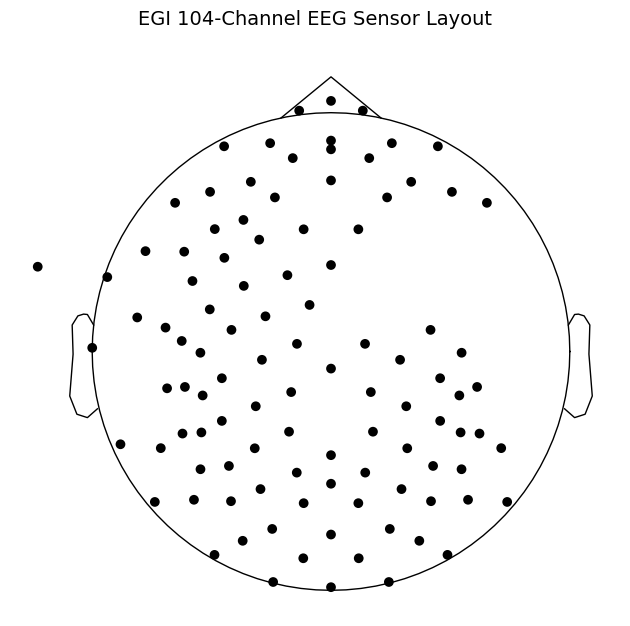

In [3]:
N_ACTIVE_CH = 104  # Active EEG channels in ZuCo
FS = 128  # Sampling rate after downsampling

# Create MNE montage for 128ch EGI system
montage = mne.channels.make_standard_montage('GSN-HydroCel-129')

# The GSN-HydroCel-129 montage has channels named E1..E129 (E129 = Cz reference)
# ZuCo data has 104 active channels mapped to E1..E104
ch_names = [f'E{i+1}' for i in range(N_ACTIVE_CH)]
info = mne.create_info(ch_names=ch_names, sfreq=FS, ch_types='eeg')
info.set_montage(montage, on_missing='ignore')

# Extract channel positions for topographic plotting
pos = np.array([info['chs'][i]['loc'][:2] for i in range(N_ACTIVE_CH)])
print(f'Montage: GSN-HydroCel-129 → using {N_ACTIVE_CH} channels')
print(f'Channel positions shape: {pos.shape}')

# Quick check: plot sensor layout
fig = mne.viz.plot_sensors(info, show_names=False, show=False)
fig.suptitle('EGI 104-Channel EEG Sensor Layout', fontsize=14)
plt.tight_layout()
plt.show()

---
## Helper Functions

In [4]:
# ── Frequency band definitions ──
BANDS = {
    'Delta (δ)\n0.5–4 Hz':  (0.5, 4),
    'Theta (θ)\n4–8 Hz':    (4, 8),
    'Alpha (α)\n8–13 Hz':   (8, 13),
    'Beta (β)\n13–30 Hz':   (13, 30),
    'Gamma (γ)\n30–64 Hz':  (30, 64),
}

def compute_band_power(eeg_data, mask, fs=128, n_channels=104):
    """
    Compute power in each frequency band for each channel.
    
    Args:
        eeg_data: (T, C) array — time × channels
        mask: (T,) array — 1 = valid, 0 = padding
        fs: sampling frequency
        n_channels: number of active channels
    
    Returns:
        dict: band_name → (n_channels,) array of power values
    """
    actual_len = int(mask.sum())
    eeg = eeg_data[:actual_len, :n_channels]  # (T', 104)
    
    band_power = {}
    for band_name, (flo, fhi) in BANDS.items():
        powers = np.zeros(n_channels)
        for ch in range(n_channels):
            signal = eeg[:, ch]
            if len(signal) < 64:
                continue
            f, psd = welch(signal, fs=fs, nperseg=min(256, len(signal)))
            # Sum power in the band
            band_mask = (f >= flo) & (f <= fhi)
            powers[ch] = psd[band_mask].sum()
        band_power[band_name] = powers
    return band_power


def average_band_power(df_subset, n_samples=100, seed=42):
    """
    Average band power across a random subset of samples.
    """
    rng = np.random.default_rng(seed)
    n = min(n_samples, len(df_subset))
    indices = rng.choice(len(df_subset), size=n, replace=False)
    
    all_powers = {band: [] for band in BANDS}
    for idx in indices:
        row = df_subset.iloc[idx]
        bp = compute_band_power(row['eeg'], row['mask'])
        for band in BANDS:
            all_powers[band].append(bp[band])
    
    avg_powers = {band: np.mean(vals, axis=0) for band, vals in all_powers.items()}
    return avg_powers


def plot_brain_topomap(data, info, ax, title='', vmin=None, vmax=None, cmap='RdYlBu_r'):
    """
    Plot a single EEG topographic map on a given axis.
    """
    mne.viz.plot_topomap(
        data, info, axes=ax, show=False,
        cmap=cmap, vlim=(vmin, vmax),
        contours=6, sensors=True, 
        names=None,
    )
    ax.set_title(title, fontsize=11, fontweight='bold', pad=8)

print('Helper functions defined ✅')

Helper functions defined ✅


---
## 1. 🧠 Frequency Band Power — Overall Brain Topomaps

Showing the **average power distribution across the scalp** for each EEG frequency band.

Computing overall band power (this may take a minute)...


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_01_overall_band_power.png'

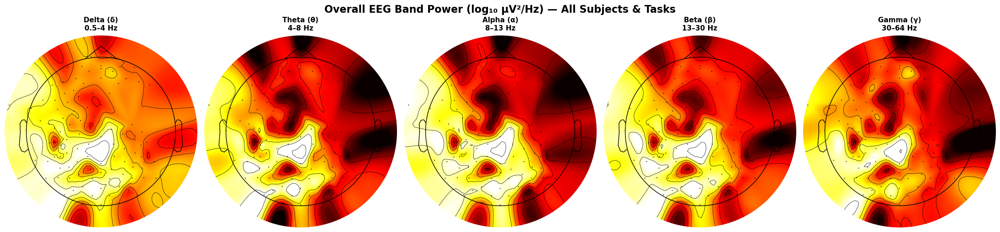

In [5]:
print('Computing overall band power (this may take a minute)...')
overall_power = average_band_power(df, n_samples=200)

fig, axes = plt.subplots(1, 5, figsize=(22, 5))

for i, (band_name, power) in enumerate(overall_power.items()):
    # Log scale for better visibility
    log_power = np.log10(power + 1e-10)
    plot_brain_topomap(log_power, info, axes[i], title=band_name, cmap='hot')

fig.suptitle('Overall EEG Band Power (log₁₀ μV²/Hz) — All Subjects & Tasks', 
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('./eda_figures/brain_01_overall_band_power.png', dpi=150, bbox_inches='tight')
plt.show()
print('Done ✅')

---
## 2. 🧠 Band Power Comparison Across Tasks

Comparing how the brain activates differently during:
- **Task 1 (SR)**: Sentiment Reading — participants read and judge sentiment  
- **Task 2 (NR)**: Normal Reading — natural reading  
- **Task 3 (TSR)**: Task-Specific (Relation) Reading — participants identify entity relations

Computing for task1...
Computing for task2...
Computing for task3...


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_02_band_power_by_task.png'

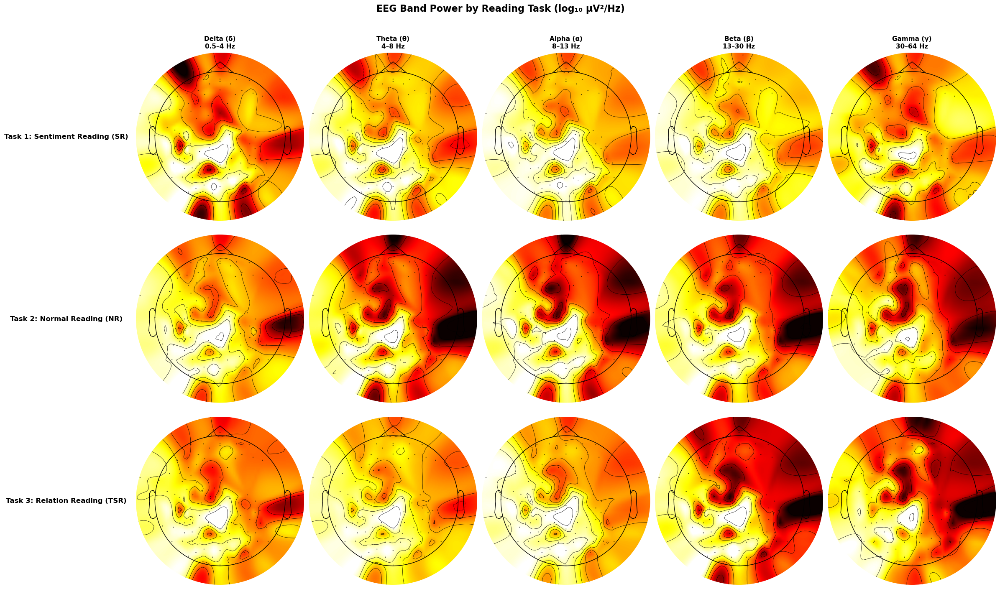

In [6]:
# Compute band power per task
task_powers = {}
task_labels = {
    'task1': 'Task 1: Sentiment Reading (SR)',
    'task2': 'Task 2: Normal Reading (NR)',
    'task3': 'Task 3: Relation Reading (TSR)',
}

for task in ['task1', 'task2', 'task3']:
    print(f'Computing for {task}...')
    subset = df[df['task'] == task]
    task_powers[task] = average_band_power(subset, n_samples=150)

# Plot: 3 tasks × 5 bands = 15 topomaps
fig, axes = plt.subplots(3, 5, figsize=(24, 14))

for row, task in enumerate(['task1', 'task2', 'task3']):
    for col, band_name in enumerate(BANDS.keys()):
        power = task_powers[task][band_name]
        log_power = np.log10(power + 1e-10)
        plot_brain_topomap(log_power, info, axes[row, col], cmap='hot')
        if col == 0:
            axes[row, col].set_ylabel(task_labels[task], fontsize=12, fontweight='bold',
                                      rotation=0, labelpad=120, va='center')
        if row == 0:
            axes[row, col].set_title(band_name, fontsize=11, fontweight='bold', pad=8)

fig.suptitle('EEG Band Power by Reading Task (log₁₀ μV²/Hz)', 
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('./eda_figures/brain_02_band_power_by_task.png', dpi=150, bbox_inches='tight')
plt.show()
print('Done ✅')

---
## 3. 🧠 Task Difference Maps

Highlighting **where brain activity differs** between tasks — subtracting the Normal Reading (Task 2) baseline from each task to reveal task-specific activation.

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_03_task_difference_maps.png'

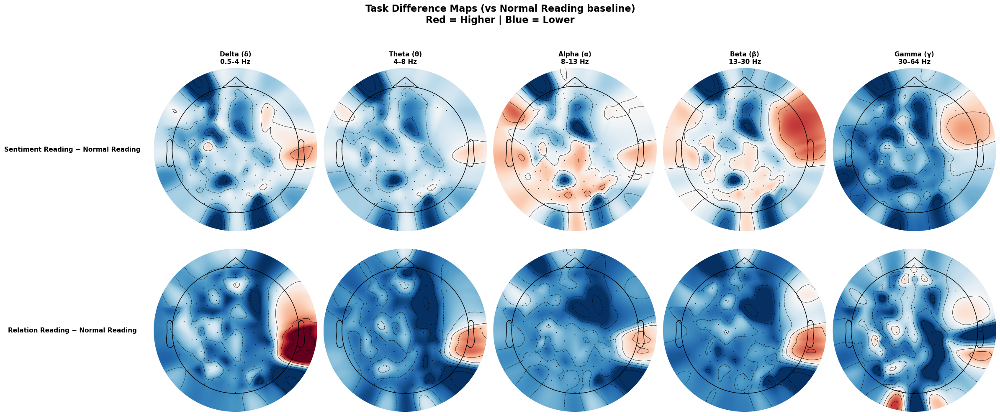

In [7]:
fig, axes = plt.subplots(2, 5, figsize=(24, 10))

diff_labels = [
    ('task1', 'task2', 'Sentiment Reading − Normal Reading'),
    ('task3', 'task2', 'Relation Reading − Normal Reading'),
]

for row, (task_a, task_b, label) in enumerate(diff_labels):
    for col, band_name in enumerate(BANDS.keys()):
        power_a = np.log10(task_powers[task_a][band_name] + 1e-10)
        power_b = np.log10(task_powers[task_b][band_name] + 1e-10)
        diff = power_a - power_b
        vmax = np.max(np.abs(diff)) * 0.8
        plot_brain_topomap(diff, info, axes[row, col], cmap='RdBu_r', 
                           vmin=-vmax, vmax=vmax)
        if col == 0:
            axes[row, col].set_ylabel(label, fontsize=11, fontweight='bold',
                                      rotation=0, labelpad=140, va='center')
        if row == 0:
            axes[row, col].set_title(band_name, fontsize=11, fontweight='bold', pad=8)

fig.suptitle('Task Difference Maps (vs Normal Reading baseline)\nRed = Higher | Blue = Lower', 
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('./eda_figures/brain_03_task_difference_maps.png', dpi=150, bbox_inches='tight')
plt.show()
print('Done ✅')

---
## 4. 🧠 Sentiment Condition Brain Maps

Comparing brain activity during **Sentiment Reading (Task 1)** across different sentiment labels.

In [8]:
# Get sentiment labels from task1
sent_df = df[(df['task'] == 'task1') & df['sentiment label'].notna() & (df['sentiment label'] != '')]
sent_labels = sorted(sent_df['sentiment label'].unique())
print(f'Sentiment labels: {sent_labels}')
print(f'Samples per label:')
print(sent_df['sentiment label'].value_counts().to_string())

# Compute band power per sentiment
sentiment_powers = {}
for label in sent_labels:
    subset = sent_df[sent_df['sentiment label'] == label]
    if len(subset) >= 10:
        print(f'  Computing {label} ({len(subset)} samples)...')
        sentiment_powers[label] = average_band_power(subset, n_samples=min(100, len(subset)))

Sentiment labels: ['negative', 'neutral', 'positive']
Samples per label:
sentiment label
positive    1431
neutral     1415
negative    1293
  Computing negative (1293 samples)...
  Computing neutral (1415 samples)...
  Computing positive (1431 samples)...


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_04_sentiment_topomaps.png'

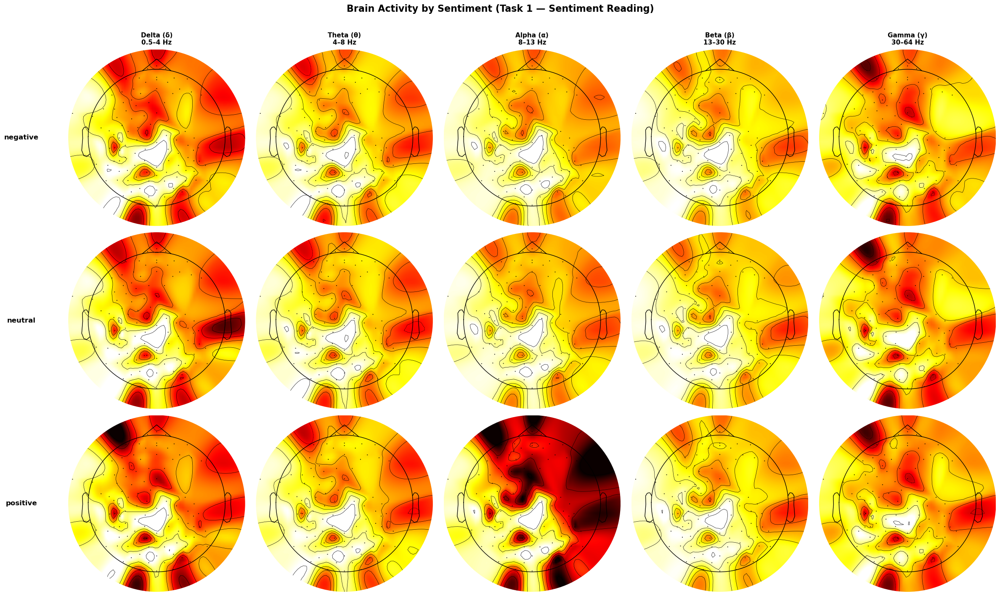

In [9]:
if sentiment_powers:
    n_sentiments = len(sentiment_powers)
    fig, axes = plt.subplots(n_sentiments, 5, figsize=(24, 4 * n_sentiments + 2))
    if n_sentiments == 1:
        axes = axes[np.newaxis, :]

    for row, (label, powers) in enumerate(sentiment_powers.items()):
        for col, band_name in enumerate(BANDS.keys()):
            power = powers[band_name]
            log_power = np.log10(power + 1e-10)
            plot_brain_topomap(log_power, info, axes[row, col], cmap='hot')
            if col == 0:
                axes[row, col].set_ylabel(f'{label}', fontsize=12, fontweight='bold',
                                          rotation=0, labelpad=80, va='center')
            if row == 0:
                axes[row, col].set_title(band_name, fontsize=11, fontweight='bold', pad=8)

    fig.suptitle('Brain Activity by Sentiment (Task 1 — Sentiment Reading)', 
                 fontsize=16, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig('./eda_figures/brain_04_sentiment_topomaps.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print('⚠️ No sentiment labels with enough data to plot.')

---
## 5. 🧠 Sentiment Difference Maps

Subtracting **Neutral** (or the most common label) brain activity from other sentiments to see what changes.

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_05_sentiment_diff_maps.png'

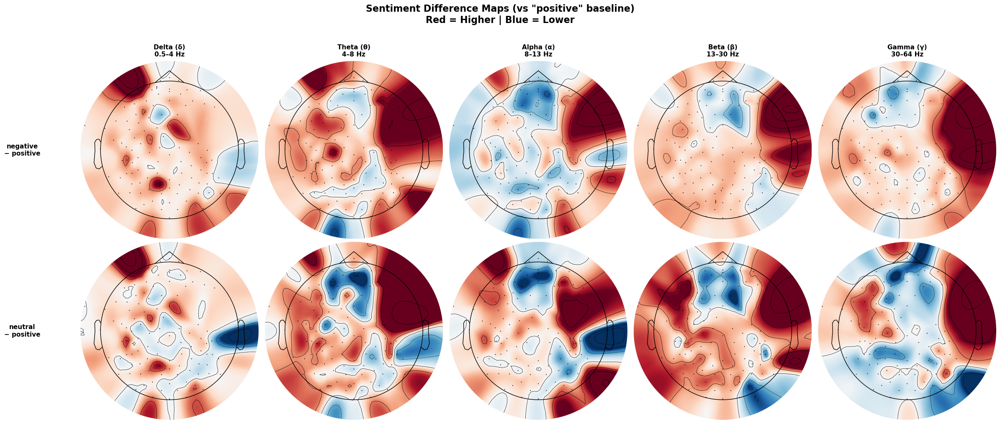

In [11]:
if len(sentiment_powers) >= 2:
    # Use the most common sentiment as baseline
    baseline_label = sent_df['sentiment label'].value_counts().index[0]
    other_labels = [l for l in sentiment_powers if l != baseline_label]
    
    if other_labels:
        n_others = len(other_labels)
        fig, axes = plt.subplots(n_others, 5, figsize=(24, 4 * n_others + 2))
        if n_others == 1:
            axes = axes[np.newaxis, :]
        
        for row, label in enumerate(other_labels):
            for col, band_name in enumerate(BANDS.keys()):
                power_a = np.log10(sentiment_powers[label][band_name] + 1e-10)
                power_b = np.log10(sentiment_powers[baseline_label][band_name] + 1e-10)
                diff = power_a - power_b
                vmax = np.max(np.abs(diff)) * 0.8
                if vmax < 1e-6:
                    vmax = 1.0
                plot_brain_topomap(diff, info, axes[row, col], cmap='RdBu_r',
                                   vmin=-vmax, vmax=vmax)
                if col == 0:
                    axes[row, col].set_ylabel(f'{label}\n− {baseline_label}', 
                                              fontsize=11, fontweight='bold',
                                              rotation=0, labelpad=100, va='center')
                if row == 0:
                    axes[row, col].set_title(band_name, fontsize=11, fontweight='bold', pad=8)
        
        fig.suptitle(f'Sentiment Difference Maps (vs "{baseline_label}" baseline)\nRed = Higher | Blue = Lower', 
                     fontsize=16, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.savefig('./eda_figures/brain_05_sentiment_diff_maps.png', dpi=150, bbox_inches='tight')
        plt.show()
else:
    print('⚠️ Need at least 2 sentiment categories for difference maps.')

---
## 6. 🧠 Relation Type Brain Maps

Comparing brain activity during **Relation Reading (Task 3)** across different entity-relation labels.

In [12]:
# Get relation labels from task3
rel_df = df[(df['task'] == 'task3') & df['relation label'].notna() & (df['relation label'] != '')]
rel_counts = rel_df['relation label'].value_counts()
print(f'Relation labels ({len(rel_counts)} types):')
print(rel_counts.to_string())

# Take top-6 most common relations for readable plots
top_relations = rel_counts.head(6).index.tolist()
print(f'\nPlotting top {len(top_relations)} relation types.')

relation_powers = {}
for label in top_relations:
    subset = rel_df[rel_df['relation label'] == label]
    if len(subset) >= 10:
        print(f'  Computing "{label}" ({len(subset)} samples)...')
        relation_powers[label] = average_band_power(subset, n_samples=min(80, len(subset)))

Relation labels (9 types):
relation label
education                1544
nationality              1535
employment               1378
job title                1358
marriage                 1328
political affiliation    1148
foundation               1096
visit                     483
awarding                  444

Plotting top 6 relation types.
  Computing "education" (1544 samples)...
  Computing "nationality" (1535 samples)...
  Computing "employment" (1378 samples)...
  Computing "job title" (1358 samples)...
  Computing "marriage" (1328 samples)...
  Computing "political affiliation" (1148 samples)...


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_06_relation_topomaps.png'

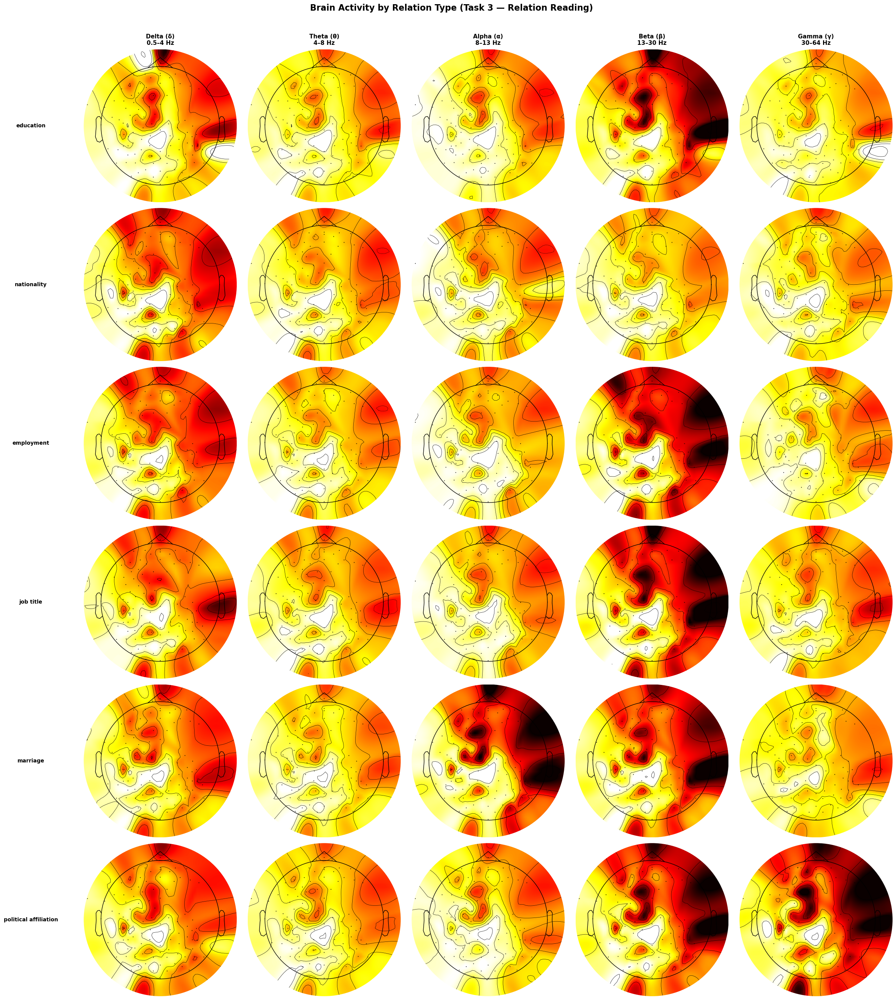

In [13]:
if relation_powers:
    n_rels = len(relation_powers)
    fig, axes = plt.subplots(n_rels, 5, figsize=(24, 4 * n_rels + 2))
    if n_rels == 1:
        axes = axes[np.newaxis, :]

    for row, (label, powers) in enumerate(relation_powers.items()):
        for col, band_name in enumerate(BANDS.keys()):
            power = powers[band_name]
            log_power = np.log10(power + 1e-10)
            plot_brain_topomap(log_power, info, axes[row, col], cmap='hot')
            if col == 0:
                # Truncate long labels
                short_label = label if len(label) < 25 else label[:22] + '...'
                axes[row, col].set_ylabel(short_label, fontsize=10, fontweight='bold',
                                          rotation=0, labelpad=100, va='center')
            if row == 0:
                axes[row, col].set_title(band_name, fontsize=11, fontweight='bold', pad=8)

    fig.suptitle('Brain Activity by Relation Type (Task 3 — Relation Reading)', 
                 fontsize=16, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig('./eda_figures/brain_06_relation_topomaps.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print('⚠️ No relation labels with enough data to plot.')

---
## 7. 🧠 Cross-Subject Brain Maps

Comparing brain activity **across subjects** — do different people show different neural signatures?

Computing Alpha for ZAB (ZuCo1, 1042 samples)...
Computing Alpha for ZDM (ZuCo1, 1040 samples)...
Computing Alpha for ZKH (ZuCo1, 967 samples)...
Computing Alpha for YAG (ZuCo2, 557 samples)...
Computing Alpha for YDR (ZuCo2, 713 samples)...
Computing Alpha for YHS (ZuCo2, 735 samples)...


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_07_cross_subject_alpha.png'

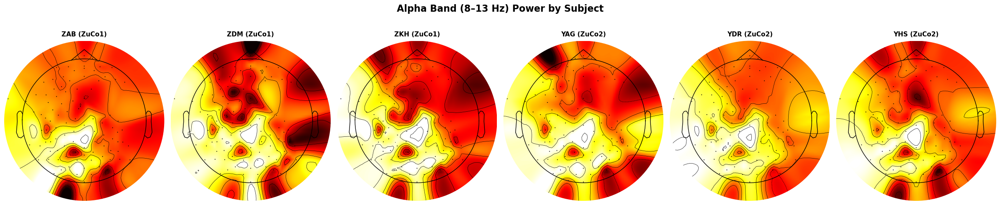

In [14]:
# Pick a few subjects from each dataset
subjects_to_plot = ['ZAB', 'ZDM', 'ZKH', 'YAG', 'YDR', 'YHS']
# Filter to subjects that exist
subjects_to_plot = [s for s in subjects_to_plot if s in df['subject'].unique()]

# Use Alpha band only for compactness
alpha_band = 'Alpha (α)\n8–13 Hz'
n_subj = len(subjects_to_plot)

fig, axes = plt.subplots(1, n_subj, figsize=(4 * n_subj, 5))
if n_subj == 1:
    axes = [axes]

for i, subj in enumerate(subjects_to_plot):
    subset = df[df['subject'] == subj]
    dataset = 'ZuCo1' if subj.startswith('Z') else 'ZuCo2'
    print(f'Computing Alpha for {subj} ({dataset}, {len(subset)} samples)...')
    powers = average_band_power(subset, n_samples=min(80, len(subset)))
    log_power = np.log10(powers[alpha_band] + 1e-10)
    plot_brain_topomap(log_power, info, axes[i], 
                       title=f'{subj} ({dataset})', cmap='hot')

fig.suptitle('Alpha Band (8–13 Hz) Power by Subject', 
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('./eda_figures/brain_07_cross_subject_alpha.png', dpi=150, bbox_inches='tight')
plt.show()

---
## 8. 🧠 Single Trial Brain Maps

Showing **individual EEG recordings** on the brain — not averages, but actual single trials.

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_08_single_trial.png'

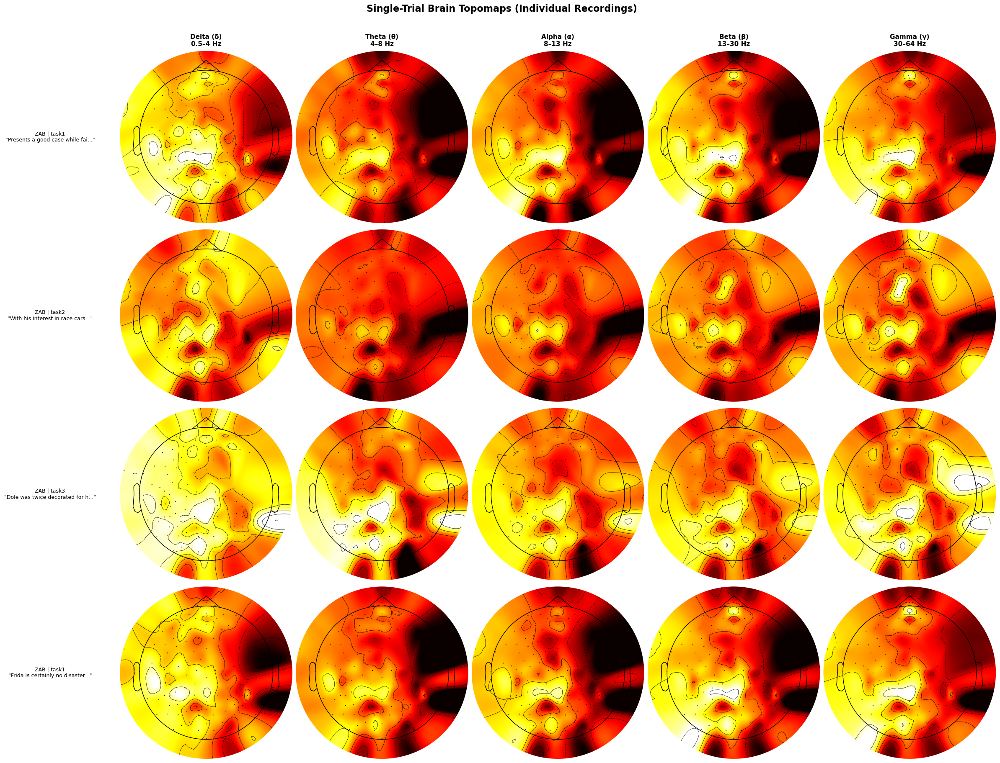

In [15]:
# Pick 4 diverse single trials
trial_indices = [
    df[df['task'] == 'task1'].index[0],  # Sentiment
    df[df['task'] == 'task2'].index[0],  # Normal Reading
    df[df['task'] == 'task3'].index[0],  # Relation
    df[df['task'] == 'task1'].index[10], # Another sentiment
]

fig, axes = plt.subplots(len(trial_indices), 5, figsize=(24, 4 * len(trial_indices) + 2))

for row_i, trial_idx in enumerate(trial_indices):
    pos_in_df = df.index.get_loc(trial_idx)
    row = df.iloc[pos_in_df]
    bp = compute_band_power(row['eeg'], row['mask'])
    
    for col, band_name in enumerate(BANDS.keys()):
        log_power = np.log10(bp[band_name] + 1e-10)
        plot_brain_topomap(log_power, info, axes[row_i, col], cmap='hot')
        if col == 0:
            text_preview = row['input text'][:30] + '...' if len(row['input text']) > 30 else row['input text']
            axes[row_i, col].set_ylabel(
                f"{row['subject']} | {row['task']}\n\"{text_preview}\"", 
                fontsize=9, rotation=0, labelpad=120, va='center'
            )
        if row_i == 0:
            axes[row_i, col].set_title(band_name, fontsize=11, fontweight='bold', pad=8)

fig.suptitle('Single-Trial Brain Topomaps (Individual Recordings)', 
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('./eda_figures/brain_08_single_trial.png', dpi=150, bbox_inches='tight')
plt.show()

---
## 9. 🧠 Average EEG Amplitude Topomaps

Instead of frequency bands, showing the **raw signal amplitude** (mean & std) across the scalp per task.

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_09_amplitude_topomaps.png'

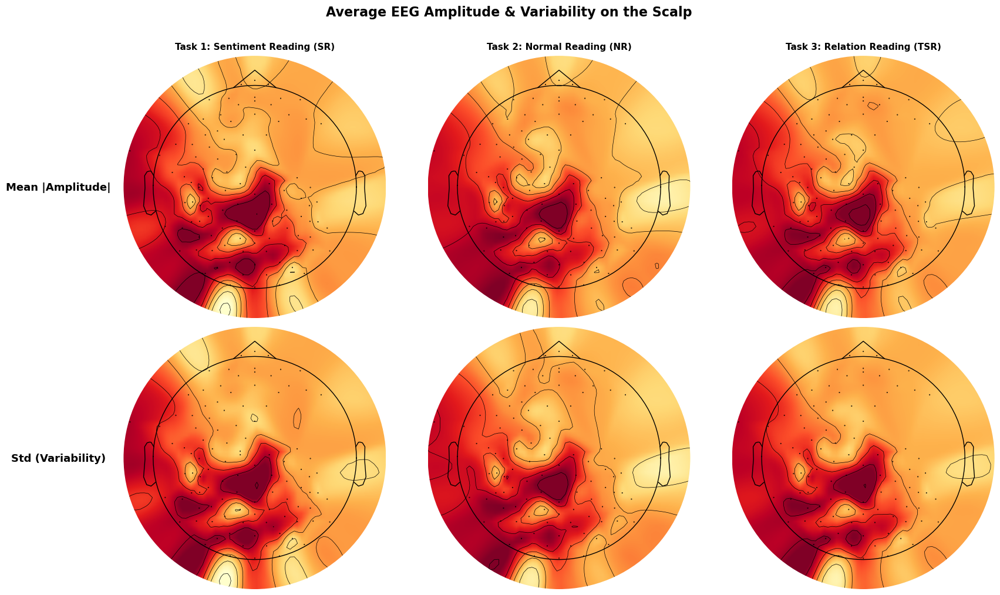

In [16]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for col, task in enumerate(['task1', 'task2', 'task3']):
    subset = df[df['task'] == task]
    n_samp = min(200, len(subset))
    rng = np.random.default_rng(42)
    indices = rng.choice(len(subset), size=n_samp, replace=False)
    
    ch_means = []
    ch_stds = []
    for idx in indices:
        row = subset.iloc[idx]
        eeg = row['eeg'][:row['mask'].sum(), :N_ACTIVE_CH]
        ch_means.append(np.abs(eeg).mean(axis=0))  # Mean absolute amplitude
        ch_stds.append(eeg.std(axis=0))
    
    avg_mean = np.mean(ch_means, axis=0)
    avg_std = np.mean(ch_stds, axis=0)
    
    plot_brain_topomap(avg_mean, info, axes[0, col], 
                       title=f'{task_labels[task]}', cmap='YlOrRd')
    plot_brain_topomap(avg_std, info, axes[1, col], cmap='YlOrRd')

axes[0, 0].set_ylabel('Mean |Amplitude|', fontsize=13, fontweight='bold',
                       rotation=0, labelpad=80, va='center')
axes[1, 0].set_ylabel('Std (Variability)', fontsize=13, fontweight='bold',
                       rotation=0, labelpad=80, va='center')

fig.suptitle('Average EEG Amplitude & Variability on the Scalp', 
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('./eda_figures/brain_09_amplitude_topomaps.png', dpi=150, bbox_inches='tight')
plt.show()

---
## 10. 🧠 ZuCo1 vs ZuCo2 Brain Comparison

Different EEG recording sessions can produce different baselines — let's compare!

Computing ZuCo1 band power...
Computing ZuCo2 band power...


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\MSc Files\\MSc Project\\E2T-w-VJEPA\\gated-glim\\GLIM\\eda_figures\\brain_10_zuco1_vs_zuco2.png'

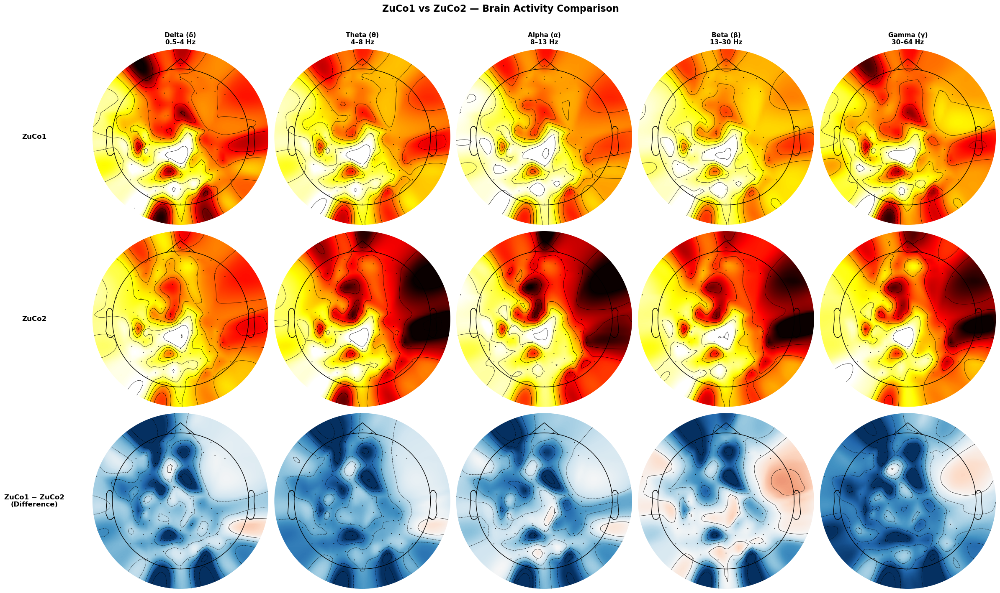

In [17]:
fig, axes = plt.subplots(3, 5, figsize=(24, 14))

zuco1_df = df[df['dataset'] == 'ZuCo1']
zuco2_df = df[df['dataset'] == 'ZuCo2']

print('Computing ZuCo1 band power...')
zuco1_power = average_band_power(zuco1_df, n_samples=200)
print('Computing ZuCo2 band power...')
zuco2_power = average_band_power(zuco2_df, n_samples=200)

row_labels = ['ZuCo1', 'ZuCo2', 'ZuCo1 − ZuCo2\n(Difference)']

for col, band_name in enumerate(BANDS.keys()):
    p1 = np.log10(zuco1_power[band_name] + 1e-10)
    p2 = np.log10(zuco2_power[band_name] + 1e-10)
    
    plot_brain_topomap(p1, info, axes[0, col], cmap='hot')
    plot_brain_topomap(p2, info, axes[1, col], cmap='hot')
    
    diff = p1 - p2
    vmax = np.max(np.abs(diff)) * 0.8
    plot_brain_topomap(diff, info, axes[2, col], cmap='RdBu_r', vmin=-vmax, vmax=vmax)
    
    if col == 0:
        for row, label in enumerate(row_labels):
            axes[row, col].set_ylabel(label, fontsize=12, fontweight='bold',
                                      rotation=0, labelpad=100, va='center')
    axes[0, col].set_title(band_name, fontsize=11, fontweight='bold', pad=8)

fig.suptitle('ZuCo1 vs ZuCo2 — Brain Activity Comparison', 
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('./eda_figures/brain_10_zuco1_vs_zuco2.png', dpi=150, bbox_inches='tight')
plt.show()
print('Done ✅')

In [ ]:
print('\n🎉 All brain topographic maps generated!')
print('📁 Figures saved to ./eda_figures/brain_*.png')